# Assignment on T-Sne using Amazon Reviews Dataset

In [27]:
#Importing all the necessary libraries
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import sqlite3 as sq
import re
import pickle
from nltk.stem import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import KeyedVectors
from nltk.corpus import stopwords
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline  

In [28]:
# Establishing a connection with amazon review database in sqlite format.
connection = sq.connect("database.sqlite")

In [29]:
# Reading the database file using pandas read sql query in AmazonReviewData variable.
AmazonReviewData = pd.read_sql_query("""SELECT * FROM Reviews WHERE Score != 3""", connection)

In [30]:

AmazonReviewData.shape

(525814, 10)

* Amazon Review has around 525814 reviews 

In [31]:
AmazonReviewData.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


# Observations:
The dataset has 525814 reviews and 10 features.  
The amazon review dataset provides the following data:  
1) Id - review ID  
2) ProductID - unique Id for a given product  
3) UserID - Unique Id for the user  
4) ProfileName - Profile name of the user  
5) HelpfulnessNumerator - number of user who found the review heplful  
6) HelpfulnessDenominator - total number of users who found the review to be helpful or not.  
7) Score - product rating between 1 to 5 ( 3 been neutral, 1 & 2 been negative and 4 & 5 been positive)  
8) Time - timestamp of the review  
9) Summary - brief sumary of the review  
10) Text - text of the review  


# Objective is to determine whether a given review is positive or not.
# To do this, we replace the score column of amazon review as positive or negative by replacing all the values in score column below 3 as negative and above 3 as positive. All the reviews with score 3 are omitted, since they are neutral reviews (Neutral reviews donot help us in determining whether a given review is positive or negative).

In [32]:
def ScoreName(num):
    """Function to replace the score column with reviews below 3 as negative and above 3 as positive."""
    if num < 3:
        return 'negative'
    else:
        return 'positive'
    


In [33]:
Score = [] # list to store the positive and negative values of the review
for x in range(len(AmazonReviewData)):
    value = ScoreName(AmazonReviewData['Score'][x])
    Score.append(value)
AmazonReviewData['Score'] = Score # Replacing the Score column of AmazonReviewData with negative and positive.
AmazonReviewData.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,positive,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,negative,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,positive,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,negative,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,positive,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [34]:
AmazonReviewData.sort_values('ProductId', axis = 0, ascending = True, inplace = True)
AmazonReviewData.shape

(525814, 10)

In [35]:
# Removing all the duplicate data from the review.
AmazonReviewDataFiltered = AmazonReviewData.drop_duplicates(subset = {"UserId","Time","Text"}, keep = "first", inplace = False)
AmazonReviewDataFiltered.shape

(364133, 10)

# There were  161681 duplicate reviews.

In [36]:
AmazonReviewDataFiltered[AmazonReviewDataFiltered.HelpfulnessNumerator > AmazonReviewDataFiltered.HelpfulnessDenominator].head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
59301,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,positive,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
41159,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,positive,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [37]:
AmazonReviewDataFiltered[AmazonReviewDataFiltered.HelpfulnessNumerator > AmazonReviewDataFiltered.HelpfulnessDenominator].shape

(2, 10)

Since HelpfulnessNumerator indicates that the review was helpful for the user and HelpfulnessDenominator indicates the whether the review has helped or not the user, therefore it is clear that helpfulnessNumerator will always be less than HelpfulnessDenominator. In all the reviews where helpfulnessNumerator is greater than HelpfulnessDenominator indicates its a false entry and therefore should be neglected. There are two such reviews as shown above 

In [38]:
#Program to remove those reviews where helpfulnessNumerator is greater than helpfulnessDenominator.
AmazonReviewDataFiltered = AmazonReviewDataFiltered[AmazonReviewDataFiltered.HelpfulnessNumerator <= AmazonReviewDataFiltered.HelpfulnessDenominator]

# Text Preprocessing

In [39]:
def HtmlTagREmover(sentence):
    """Function to remove html tag from the text column of the amazon review dataset."""
    tagPattern = re.compile('<*.?>')
    textClean = re.sub(tagPattern,r'', sentence)
    return textClean

In [40]:
def PuncRemover(sentence):
    """Function to remove punctuations or any special characters from the text column of the review."""
    punPattern = re.sub(r'[? | ! | \ | \' | " | # | . | , | : | ( | ) | / | ]', r'', sentence)
    return punPattern

In [41]:
stopWordRequired = {'not'}
snoBallStemmer = SnowballStemmer ('english') # initialising the snowball stemmer
stopWordsEnglish = set(stopwords.words('english', )) - stopWordRequired #set of all the stopwords in english except 'not'.

In [42]:
# Program to remove stopwords, punctuations, special characters and stemming each words. 
i = 0
allPositiveWords = [] # list of all positive words
allNegativeWords = [] # list of all negative words
finalFilteredSent = [] # list of all positive and negative words.
for sentn in AmazonReviewDataFiltered['Text'].values:
    filteredSent = []
    sentn = HtmlTagREmover(sentn)
    for word in sentn.split():
        for cleanedWord in PuncRemover(word).split():
            if (cleanedWord.isalpha() & (len(cleanedWord) > 2)):
                if (cleanedWord.lower() not in stopWordsEnglish):
                    stemmerWord = snoBallStemmer.stem(cleanedWord.lower())
                    filteredSent.append(stemmerWord)
                    if (AmazonReviewDataFiltered['Score'].values)[i] == 'positive':
                        allPositiveWords.append(stemmerWord)
                    else:
                        allNegativeWords.append(stemmerWord)
                else:
                    continue
            else:
                continue
    i += 1
    string1 =" ".join(filteredSent)
    finalFilteredSent.append(string1)
            
        

In [49]:
print("Amazon Review before text preprocessing :%r \n " %AmazonReviewData['Text'][0])
AmazonReviewDataFiltered['Text'] = finalFilteredSent # Replacing the original text of amazon review datatset with the filtered one.

print("Amazon Review after text preprocessing : %r" %AmazonReviewDataFiltered['Text'][0])

Amazon Review before text preprocessing :'I have bought several of the Vitality canned dog food products and have found them all to be of good quality. The product looks more like a stew than a processed meat and it smells better. My Labrador is finicky and she appreciates this product better than  most.' 
 
Amazon Review after text preprocessing : 'bought sever vital can dog food product found good qualiti product look like stew process meat smell better labrador finicki appreci product better'


In [23]:
# Extablishing connection and storing the filtered amazon data set in AmazonReviewDataFiltered.sqlite database
conn = sq.connect('AmazonReviewDataFiltered.sqlite')
AmazonReviewDataFiltered.to_sql('Reviews', conn,if_exists= 'replace' )


In [4]:
conn = sq.connect('AmazonReviewDataFiltered.sqlite')
AmazonReviewDataFiltered = pd.read_sql_query("""SELECT * FROM Reviews """, conn)

In [5]:
AmazonReviewDataFiltered['Score'].value_counts()

positive    307026
negative     57105
Name: Score, dtype: int64

# Observation:
**There are 307026 positive reviews and 57105 negative reviews out of 364131 total reviews. Hence we have 84.3 % of positive reviews and 15.7% negative reviews  **

** It also tells us that the amazon review dataset has an imbalanced dataset.**

In [6]:
# Sampling 10000 data points from AmazonREviewDataFiltered to perform BoW, TF - IDF, word2vec and TF - IDF avgerage w2v, to reduce processing time.
AmazonPositiveReviewData = AmazonReviewDataFiltered[AmazonReviewDataFiltered['Score'] == 'positive'].sample(n =8430) # Sampling 8430 positive data points from AmazonReviewDataFiltered, i.e. 84.3%
AmazonNegativeReviewData = AmazonReviewDataFiltered[AmazonReviewDataFiltered['Score'] == 'negative'].sample(n = 1570) # Sampling 1570 negative data points from AmazonReviewDataFiltered, i.e. 15.7%
AmazonReviewDataSampled = AmazonPositiveReviewData.append(AmazonNegativeReviewData, ignore_index= True) # Appending the samples of positive and negative data points to form AmazonReviewDataSampled 

In [7]:
AmazonReviewDataSampled.shape

(10000, 11)

In [8]:
AmazonReviewDataSampled['Score'].value_counts()

positive    8430
negative    1570
Name: Score, dtype: int64

In [ ]:
# Extablishing connection and storing the filtered amazon data set in AmazonReviewDataSampled.sqlite database
conn = sq.connect('AmazonReviewDataSampled.sqlite')
AmazonReviewDataSampled.to_sql('Reviews', conn,if_exists= 'replace' )

In [2]:
conn = sq.connect('AmazonReviewDataSampled.sqlite')
AmazonReviewDataSampled = pd.read_sql_query("""SELECT * FROM Reviews """, conn)

# Bag of Words

In [9]:
# Initialising and obtaining the bag of words of the AmazonReviewDataSampled['Text']
bagOfWordsVec = CountVectorizer() 
bagOfWordsVectors = bagOfWordsVec.fit_transform(AmazonReviewDataSampled['Text'].values)


In [10]:
bagOfWordsVectors

<10000x15170 sparse matrix of type '<class 'numpy.int64'>'
	with 316552 stored elements in Compressed Sparse Row format>

# Observaitons: Bag of words is a sparse matrix with 15170 words

In [13]:
#Program to store the bag of words vectors
bag_saved_value = open('bowsaved', 'wb')
pickle.dump(bagOfWordsVectors, bag_saved_value)

In [3]:
# loading the stored bag of words vector
fileBow = open('bowsaved', 'rb')
bagofWordsVector = pickle.load(fileBow)

In [4]:
# Program to perform dimension reduction using Truncated SVD to 50 dimensions
bagofWordsVectorTruncatedSVD = TruncatedSVD(n_components= 50).fit_transform(bagofWordsVector)
bagofWordsVectorTruncatedSVD.shape

(10000, 50)

# TF - IDF 

In [16]:
#Inilialzing and obtaining the TF-IDF of AmazonReviewDataSampled['Text']
tfidfVec = TfidfVectorizer(ngram_range=(1,2))
tfidfVectors = tfidfVec.fit_transform(AmazonReviewDataSampled['Text'].values)

In [17]:
features = tfidfVec.get_feature_names()# to get the features of tfidf vector.

In [18]:
#Program to store the tf-idf vectors
feattfidf = open('featurestfidfsaved', 'wb')
pickle.dump(features, feattfidf)

tfidf = open('tfidfvectorsaved', 'wb')
pickle.dump(tfidfVectors, tfidf)

In [6]:
file = open('tfidfvectorsaved', 'rb')
tfidfVectors =pickle.load(file) 
tfidfVectors

<10000x238414 sparse matrix of type '<class 'numpy.float64'>'
	with 684492 stored elements in Compressed Sparse Row format>

In [7]:
# Program to perform dimension reduction using Truncated SVD to 50 dimensions
tfidfvectorTruncatedSVD = TruncatedSVD(n_components= 50).fit_transform(tfidfVectors)
tfidfvectorTruncatedSVD.shape

(10000, 50)

# Word2Vec,TF - IDF weighted AvgWord2Vec

In [14]:
# Program to load a model of dimension 300 using Google news negative 300 for obtaining the word2vec of a given word.
modelW2V = KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin.gz', binary= True)

In [15]:
w2vecmodel = open('modelgoogle300negative', 'wb')
pickle.dump(modelW2V, w2vecmodel)

In [25]:
filemodel = open ('modelgoogle300negative', 'rb')
modelW2V = pickle.load(filemodel)

In [26]:
# Program to obtain the the word2vec, avg word2vec, tf-idf avg word2vec for each review text of Amazon Data set
word2vectors = [] # list to store the word2vec
avgWord2Vector = []# list to store avg word2vec
tfidfweightedAvgWord2Vec = [] # list to store tfidf avg word2vec
row = 0
for sentence in AmazonReviewDataSampled['Text'].values: # obtaining the text of each review.
    #print(row)
    sentenceVector = np.zeros(300) # initializing a vector of dimension 300 to store the word2vec for each word of a text of given review.
    tfword2Vec = np.zeros(300) # initializing a vector of dimension 300 to store the tfidf of each word in a text of a given review
    count = 0
    weight = 0
    for word in sentence.split(): # obtain each word of a given text and obtianing the vector of each word.
        #print(word)
        if word in (modelW2V.wv.vocab):
            sentenceVector += modelW2V.wv[word] # obtaining the word2vec for each sentenc in a given review text.
            wordvec = modelW2V.wv[word] # obtaining the word2vec for each word.
            tfidf1 = tfidfVectors[row,features.index(word)] # obtaining the TFIDF vector of word.
            tfword2Vec += (wordvec * tfidf1) # obtaining the tfidf for each sentence in a given review text.
            count += 1
            
            weight += tfidf1
        else:
            continue
    
    word2vectors.append(sentenceVector) # word2vec for each review text.
    if count != 0:
        sentenceVector /= count
    avgWord2Vector.append(sentenceVector) # avg word2vec for each review text.
    if weight != 0:
        tfword2Vec /= weight
    tfidfweightedWord2Vec.append(tfword2Vec) # tfidf avg word2vec for each review text.
    row += 1


In [21]:
#Program to store the word2vect , avg word2vec and tfidf weighted word2vec variables.
w2vsaved = open('word2vecsaved', 'wb')
pickle.dump(word2vectors, w2vsaved)

avw2v = open('avword2vecsaved','wb')
pickle.dump(avgWord2Vector, avw2v)

tfidfw2v = open('tfidfword2vecsaved', 'wb')
pickle.dump(tfidfweightedWord2Vec, tfidfw2v)

In [3]:
#Program to load the word2vect , avg word2vec and tfidf weighted word2vec variables.
file1 = open('word2vecsaved', 'rb')
word2vectors = pickle.load(file1)

file2 = open('avword2vecsaved', 'rb')
avgWord2Vector = pickle.load(file2)

file3 = open('tfidfword2vecsaved', 'rb')
tfidfweightedWord2Vec = pickle.load(file3)

# T- SNE

In [11]:
def dimensionReductionTsneStepSize(array1,array2):
    """Function to obatin the T -sne plots for 500,1000,2000,3000 and 5000 step size and perplexity 50"""
 
    iterlistvalues = [500,1000,  2000,3000,  5000] # different step sizes
   
    for ivalue in iterlistvalues:
        modelTSNE = TSNE (n_components= 2, random_state= 0, perplexity= 50,n_iter= ivalue) #initializing the t-sne model with 2 dimensions, perplexity 50 and step size 500,1000,  2000,3000 and 5000
        tsne = modelTSNE.fit_transform(array1)
        tsne = np.vstack((tsne.T , array2)).T
        dftsneword2vec = pd.DataFrame(data = tsne, columns = ("Dim_1", "Dim_2", "Label"))
        
        plt.figure(figsize= (8,8)) # Function to adjust the figure size.
        sns.scatterplot(x = 'Dim_1', y = 'Dim_2',data = dftsneword2vec, hue = 'Label' )
        plt.title( "tsne plot with perplexity 50 and step  %r" %ivalue )
        plt.show()
        


In [12]:

def dimensionReductionTsnePerplexity(array1, array2):
    """Function to obtain the T-Sne plots for perplexity values of 2,5,10,15, 30 and 50 and step size 5000"""
    perplexitylistvalue = [2,5,10,15,30,50] # different perplexity values
   
    
    for pvalue in perplexitylistvalue:
        modelTSNE = TSNE (n_components= 2, random_state= 0, perplexity= pvalue,n_iter= 5000 )#initializing the t-sne model with 2 dimensions, perplexity 2,5,10,15,30 and 50 and step size 5000
        tsne = modelTSNE.fit_transform(array1)
        tsne = np.vstack((tsne.T , array2)).T
        dftsneword2vec = pd.DataFrame(data = tsne, columns = ("Dim_1", "Dim_2", "Label"))
        plt.figure(figsize= (8,8))
        sns.scatterplot(x = 'Dim_1', y = 'Dim_2',data = dftsneword2vec, hue = 'Label' )
        plt.title( "tsne plot with perplexity %r and step  5000" %pvalue )
        plt.show()
        

# TSNE PLOT FOR BAG OF WORDS

In [54]:
#Program to perform Column standardization on bag of words vector
AmazonReviewDataSampledStandardized = StandardScaler().fit_transform(bagofWordsVectorTruncatedSVD)

In [55]:
#Storing the column standardized vector
stand_bow = open('StandardizedBow', 'wb')
pickle.dump(AmazonReviewDataSampledStandardized, stand_bow)

<Figure size 720x720 with 0 Axes>

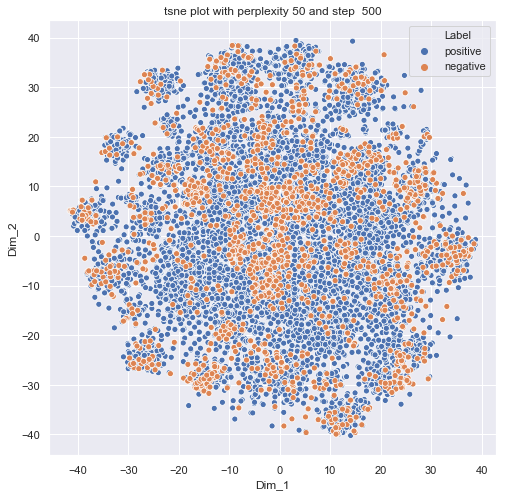

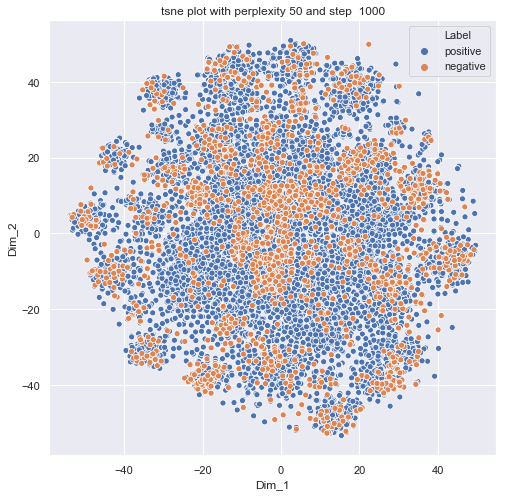

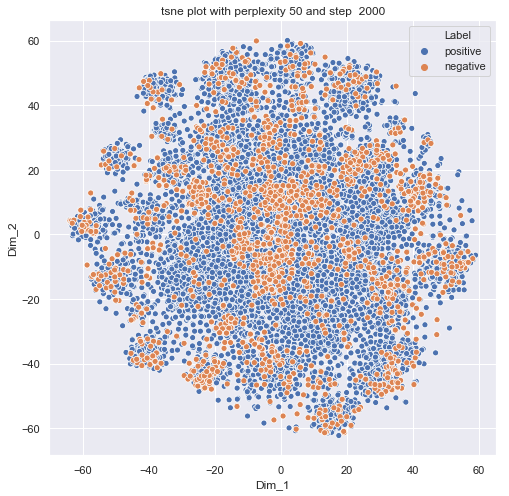

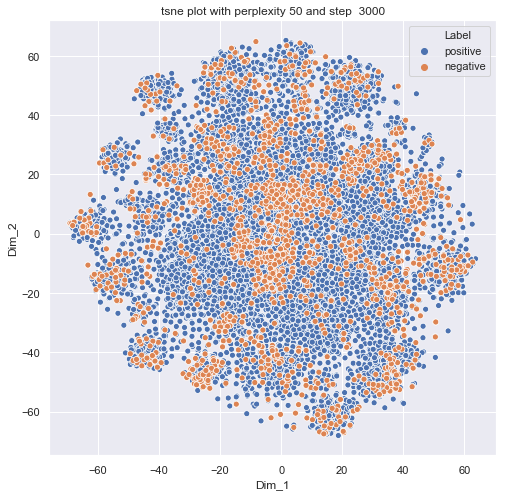

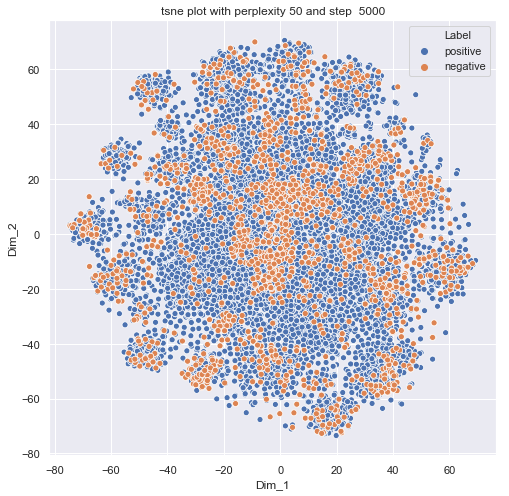

In [64]:
#Performing T-Sne for different step size
dimensionReductionTsneStepSize(AmazonReviewDataSampledStandardized,AmazonReviewDataSampled['Score'])

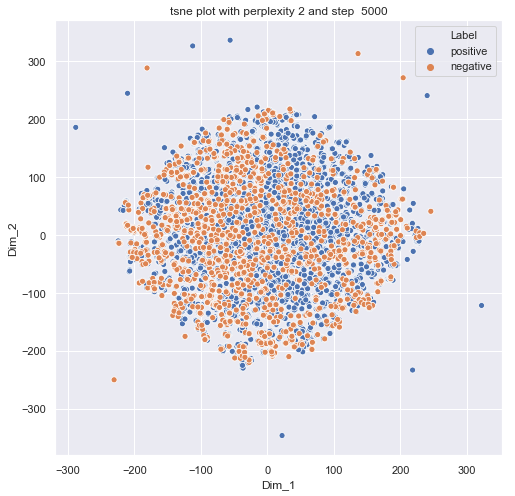

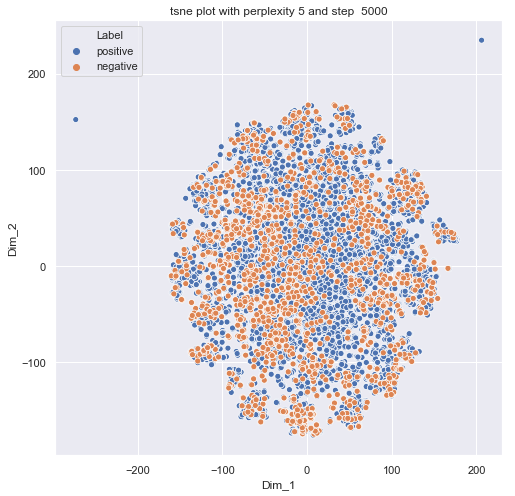

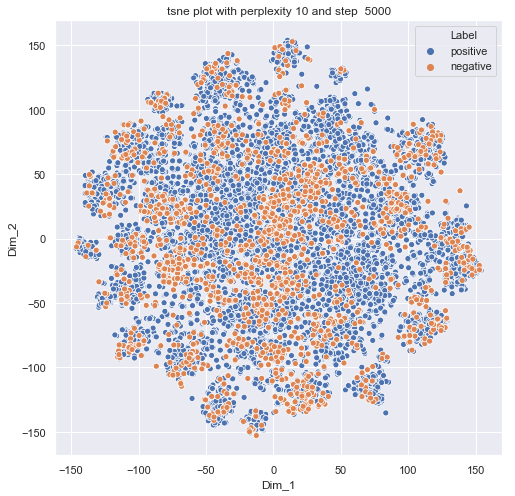

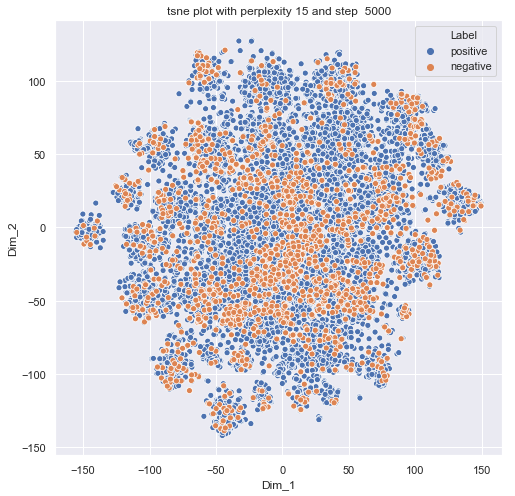

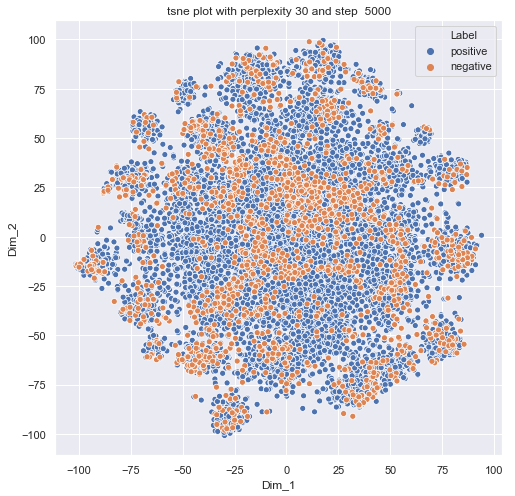

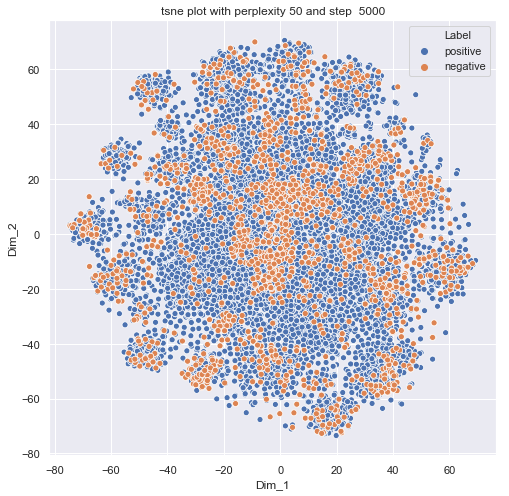

In [61]:
#Performing T Sne with different Perplexity values
dimensionReductionTsnePerplexity(AmazonReviewDataSampledStandardized,AmazonReviewDataSampled['Score'])

# T-SNE PLOT FOR TFIDF 

In [8]:
#Program to perform column standardization on TF - IDF vector
AmazonReviewDataSampledStandardized_tfidf = StandardScaler().fit_transform(tfidfvectorTruncatedSVD)

In [9]:
# Program to store the column standardized values of TF - IDF
tfidfvec_save = open('tfidfvectortrunsvd', 'wb')
pickle.dump(AmazonReviewDataSampledStandardized_tfidf, tfidfvec_save)

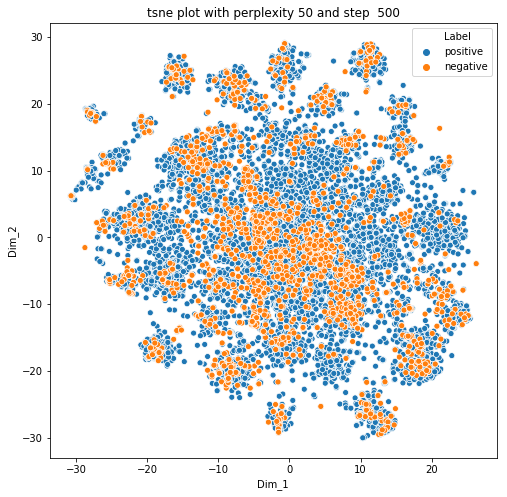

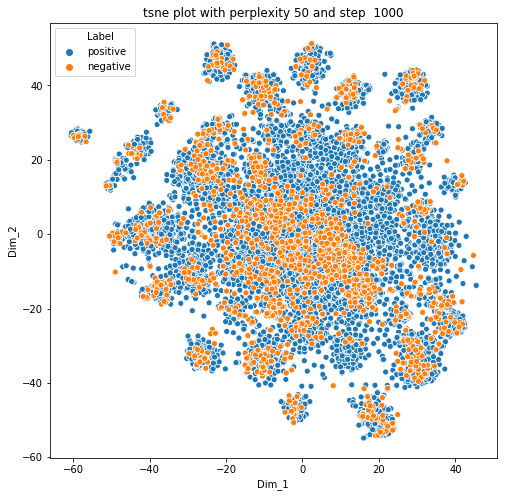

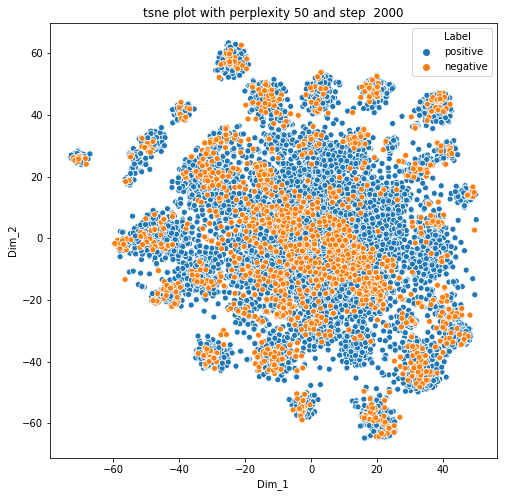

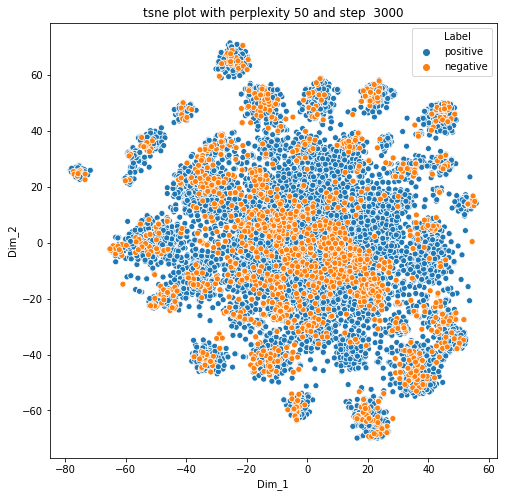

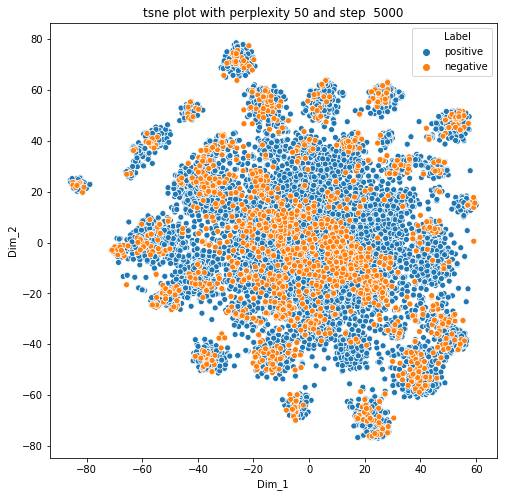

In [13]:
#Performing T SNE with different step size
dimensionReductionTsneStepSize(AmazonReviewDataSampledStandardized_tfidf, AmazonReviewDataSampled['Score'])

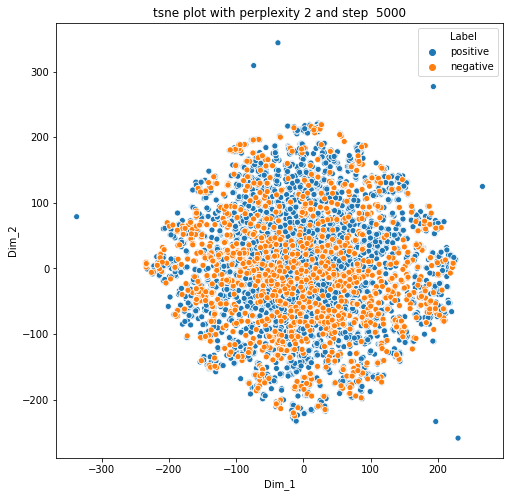

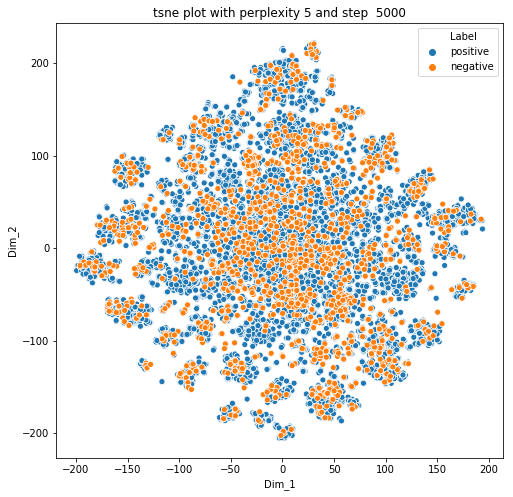

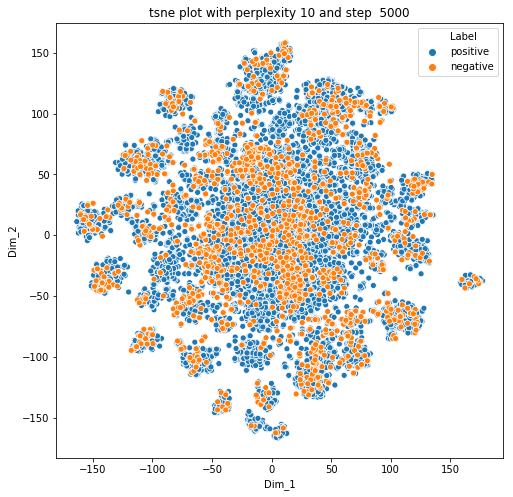

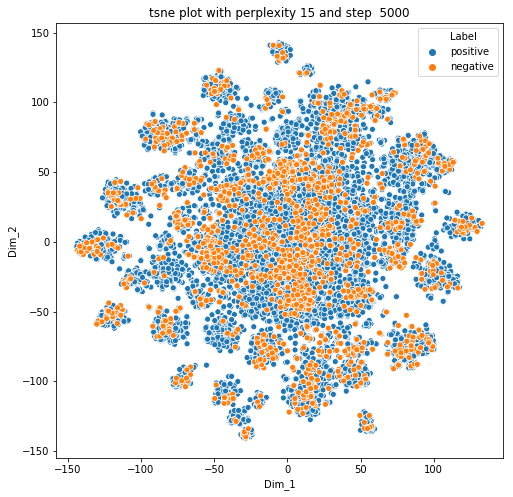

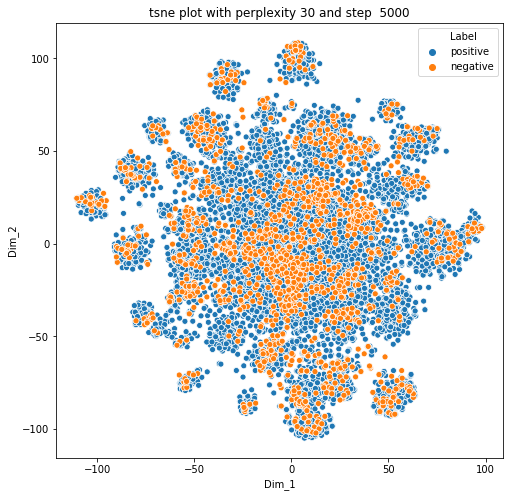

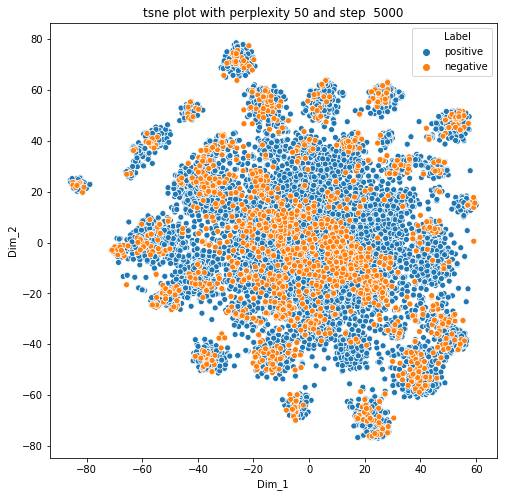

In [14]:
#Performing T SNE with different perplexity values
dimensionReductionTsnePerplexity(AmazonReviewDataSampledStandardized_tfidf, AmazonReviewDataSampled['Score'])

# T-Sne plot for Average Word2Vector

In [15]:
#Performing column standardization on Average Word2Vector
AmazonReviewDataSampledStandardized_avgword2vec = StandardScaler().fit_transform(avgWord2Vector)

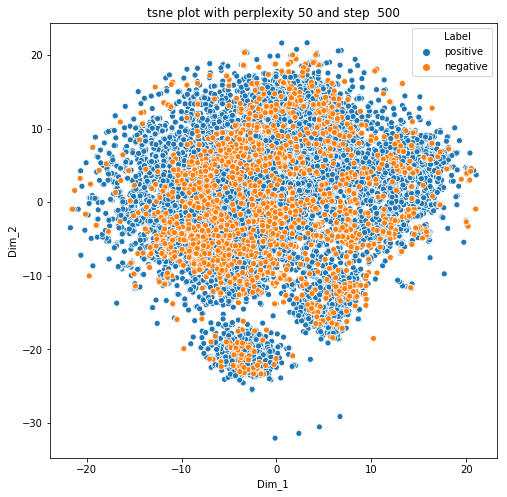

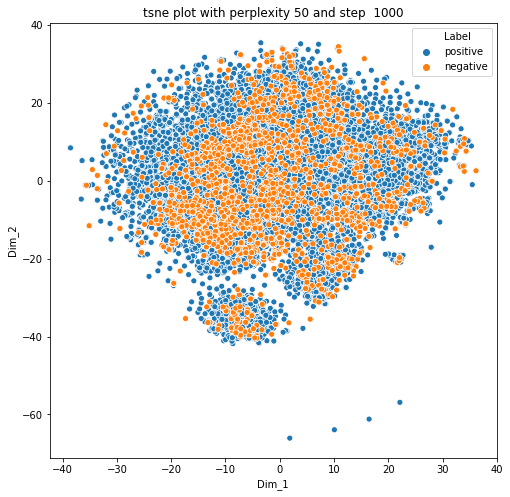

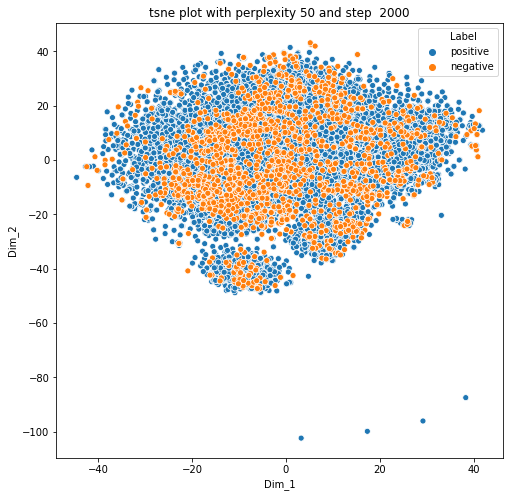

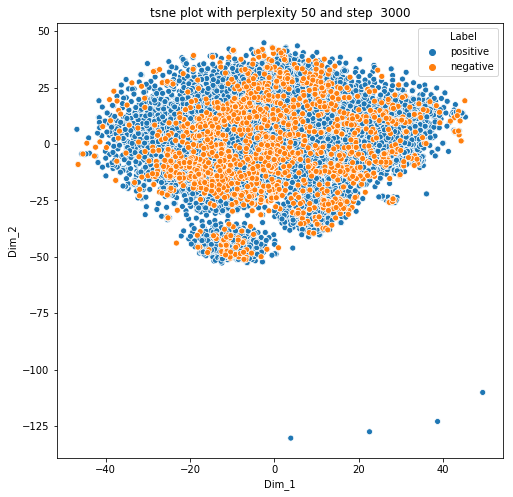

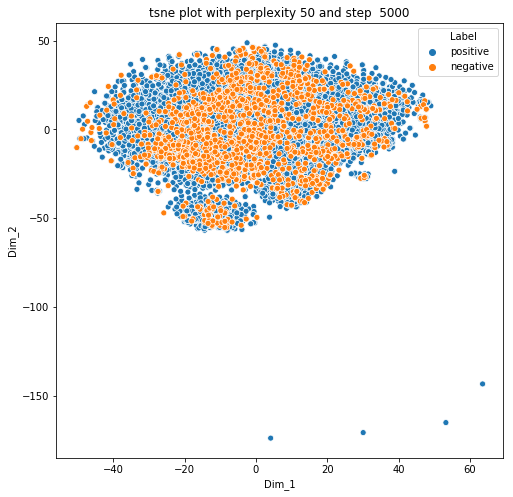

In [22]:
#Performing T SNE with different step size
dimensionReductionTsneStepSize(AmazonReviewDataSampledStandardized_avgword2vec,AmazonReviewDataSampled['Score'])

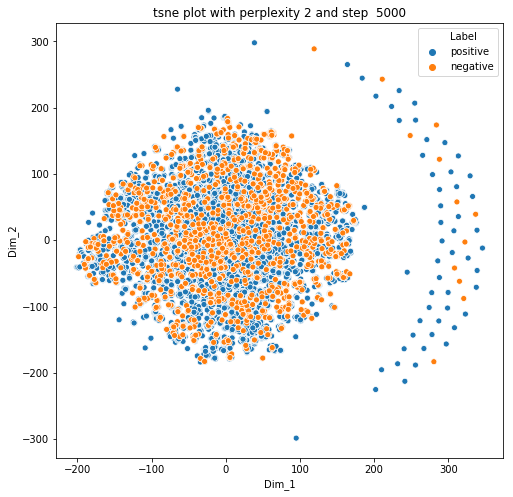

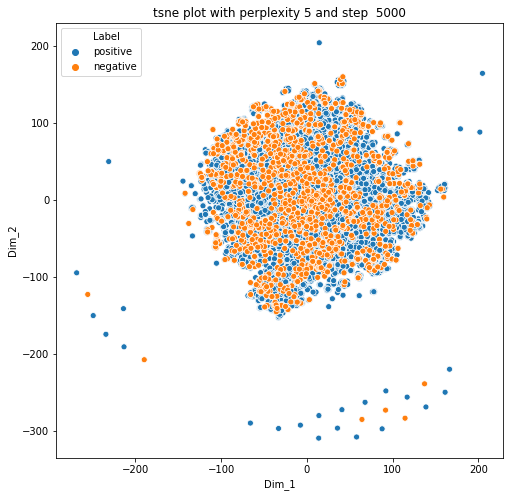

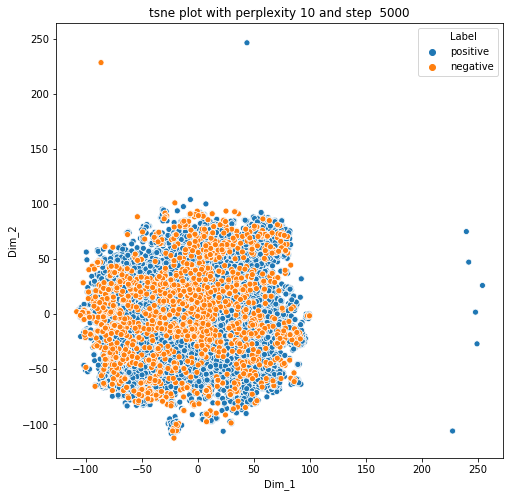

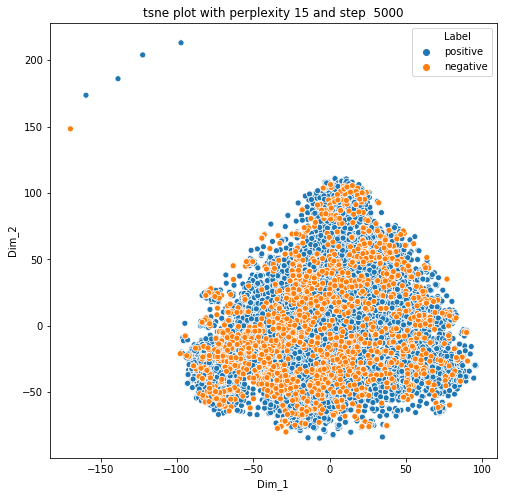

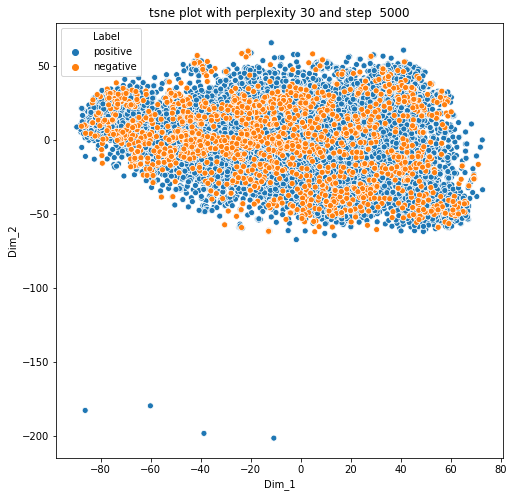

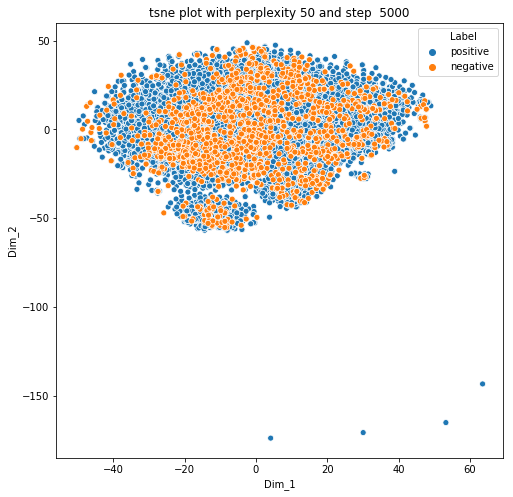

In [17]:
dimensionReductionTsnePerplexityplexityerplexity(AmazonReviewDataSampledStandardized_avgword2vec,AmazonReviewDataSampled['Score'])

# T-Sne plot for TF -IDF Weighted  Word2Vector

In [19]:
# Program to perform column standardization of TF - IDF weighted word2vector
AmazonReviewDataSampledStandardized_tfidfavword2vec = StandardScaler().fit_transform(tfidfweightedAvgWord2Vec)

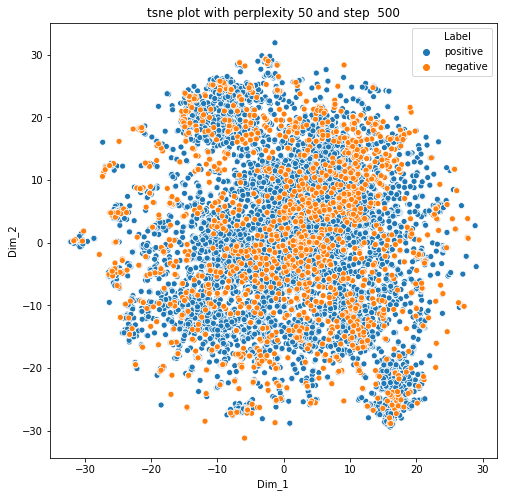

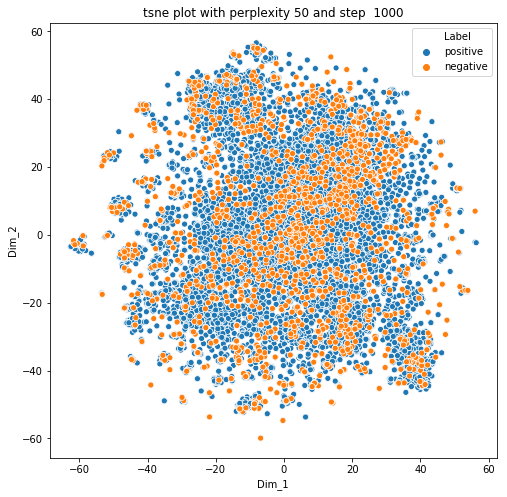

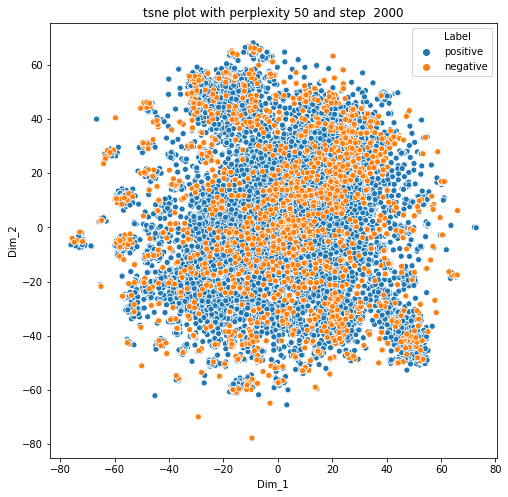

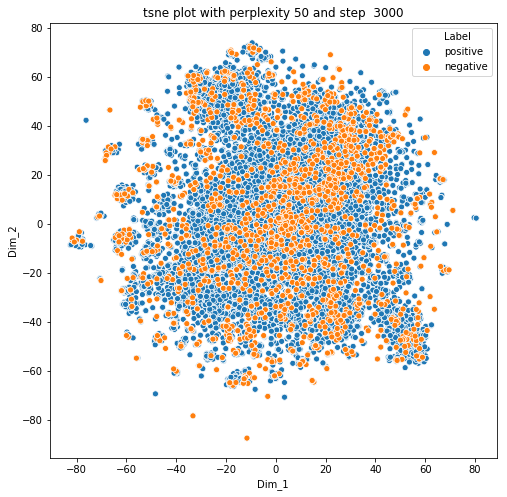

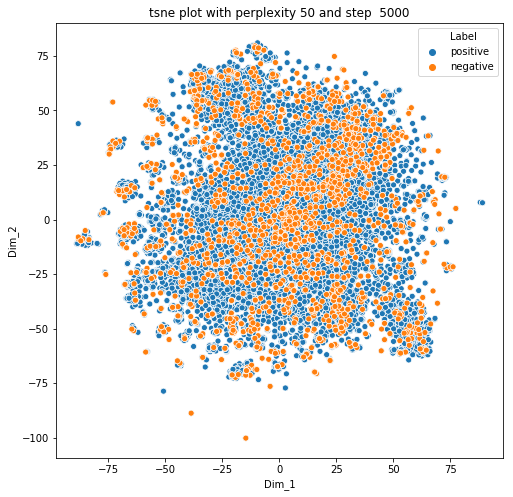

In [20]:
#Program to perform T SNE with different step size
dimensionReductionTsneStepSize(AmazonReviewDataSampledStandardized_tfidfavword2vec,AmazonReviewDataSampled['Score'])

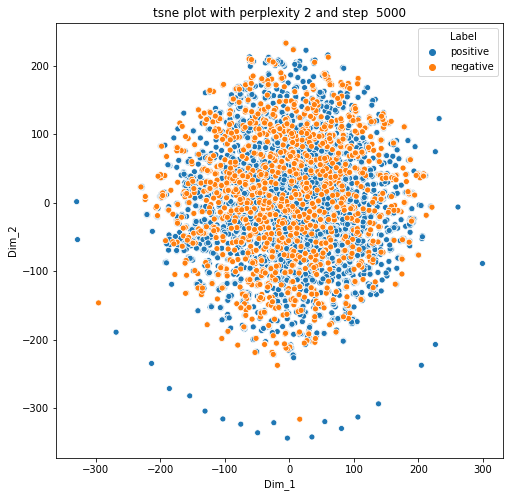

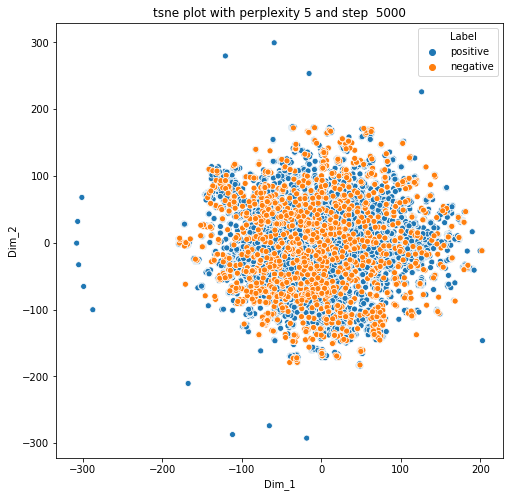

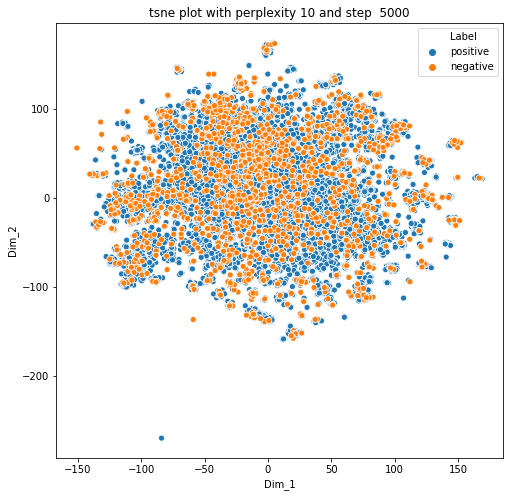

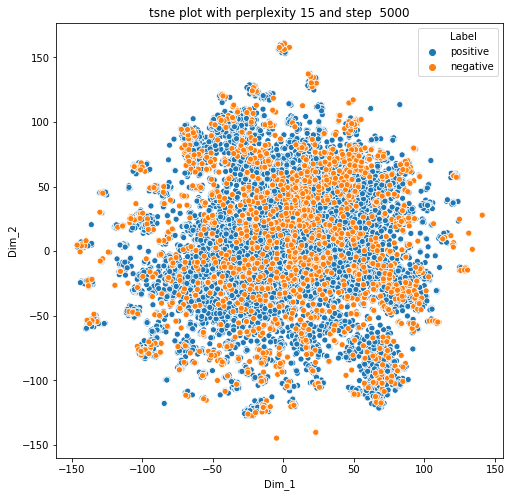

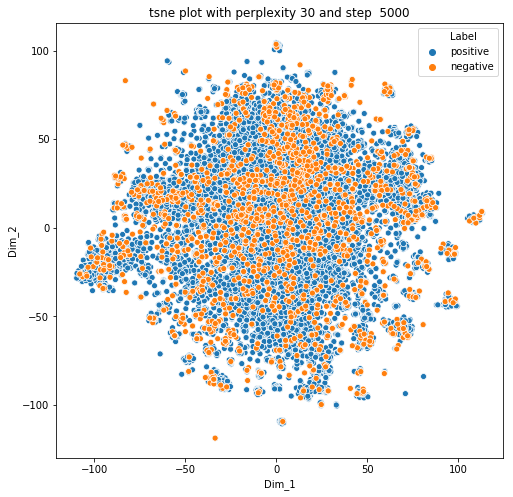

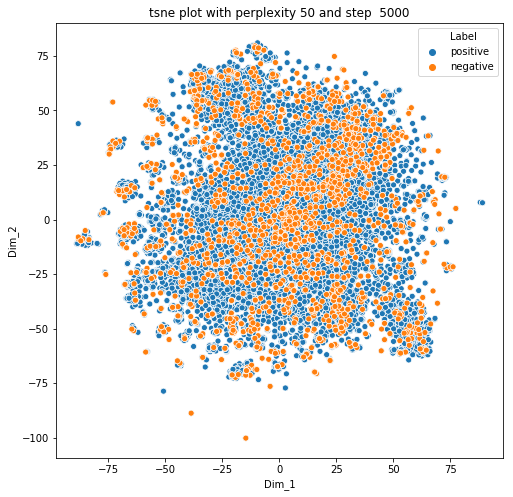

In [21]:
#Program to perform T SNE with different perplexity values
dimensionReductionTsnePerplexity(AmazonReviewDataSampledStandardized_tfidfavword2vec,AmazonReviewDataSampled['Score'])

# END